This notebook aims to predict a building's energy consumption over 2017 and 2018 using the data from 2016 in 4 different consumpiton categories (electricity, chilled water, steam, hot water) using ASHRAE data, which is our problem statement as well.

This notebook will focus on parts 1 and 2 and provide information about the datasets with a detailed EDA

In [448]:
import numpy as np 
import pandas as pd 
import pandas_profiling as pp

pd.set_option('display.max_columns',50)
pd.set_option('display.float_format', lambda x: '%.5f'%x)

#for date  manipulation
from datetime import datetime

# for vislalization
import matplotlib.pyplot as plt
 # to display visuals in the notebook
%matplotlib inline

import seaborn as sns
sns.set_context(font_scale=2)
sns.set_style("darkgrid")

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
# to cleanup memory usage
import gc

***train.csv***
building_id - Foreign key for the building metadata.

meter - The meter id code. Read as {0: electricity, 1: chilledwater, 2: steam, 3: hotwater}. Not every building has all meter types.

timestamp - When the measurement was taken

meter_reading - The target variable. Energy consumption in kWh (or equivalent). Note that this is real data with measurement error, which we expect will impose a baseline level of modeling error. UPDATE: as discussed here, the site 0 electric meter readings are in kBTU.

***building_meta.csv***
site_id - Foreign key for the weather files.

building_id - Foreign key for training.csv

primary_use - Indicator of the primary category of activities for the building based on EnergyStar property type definitions

square_feet - Gross floor area of the building

year_built - Year building was opened

floor_count - Number of floors of the building

***weather_[train/test].csv***
Weather data from a meteorological station as close as possible to the site.
site_id

air_temperature - Degrees Celsius

cloud_coverage - Portion of the sky covered in clouds, in oktas

dew_temperature - Degrees Celsius

precip_depth_1_hr - Millimeters

sea_level_pressure - Millibar/hectopascals

wind_direction - Compass direction (0-360)

wind_speed - Meters per second


# 1. Understand, Clean and Format the data

```train.csv``` and ```weather.csv``` are time series data, with hourly measurements

```building_metadata.csv``` contains the characteristics of a building such as:
* site id of the building
* primary use
* square feet
* year built

In the weather datasets, there are features related to wind, clouds, temperature and pressure.

Weather_train dataset measured from 1 Jan, 2016 to 1 Jan, 2017.

Weather_test dataset spans from 1 Jan, 2017 to 1, Jan 2019.

So using 1 year data we are going to predict following 2 years energy consumption of a building

## 1.1. Load data into dataframes

time series data will be loaded by parsing timestamp column to enabling timestamp column to be formatted as datetime datatype and as index 

In [262]:
# train data

building = pd.read_csv('building_metadata.csv')
train = pd.read_csv('train.csv',index_col=2, parse_dates = True)
weather_data = pd.read_csv('weather_train.csv',index_col=1, parse_dates = True)

In [263]:
# look at the number of rows and columns
print('Size of the building dataset is ',building.shape)
print('Size of the train dataset is ',train.shape)
print('Size of the weather_data dataset is ',weather_data.shape)

Size of the building dataset is  (1449, 6)
Size of the train dataset is  (20216100, 3)
Size of the weather_data dataset is  (139773, 8)


We are dealing with some big datasets here (20 million rows). hence we need to save up some space

## 1.2. Reduce the memory size

In [264]:
def reduce_memory_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16','float32', 'float32']
    start_mem = df.memory_usage().sum() / (1024**2)
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
                    
            else:
                if c_min > np.iinfo(np.float16).min and c_max < np.iinfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.iinfo(np.float32).min and c_max < np.iinfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
    end_mem = df.memory_usage().sum()/ (1024**2)
    
    if verbose:
        print('Memory usage decreased to {:5.2f}Mb ({:.1f}%  reduction) '.format(end_mem , 100*((start_mem - end_mem)/start_mem)))
    return df
                

In [265]:
reduce_memory_usage(building)
reduce_memory_usage(train)
reduce_memory_usage(weather_data)

Memory usage decreased to  0.04Mb (35.4%  reduction) 
Memory usage decreased to 366.31Mb (40.6%  reduction) 
Memory usage decreased to  8.66Mb (9.7%  reduction) 


,site_id,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
timestamp,,,,,,,,
2016-01-01 00:00:00,0,25.00000,6.00000,20.00000,nan,1019.70000,0.00000,0.00000
2016-01-01 01:00:00,0,24.40000,nan,21.10000,-1.00000,1020.20000,70.00000,1.50000
2016-01-01 02:00:00,0,22.80000,2.00000,21.10000,0.00000,1020.20000,0.00000,0.00000
2016-01-01 03:00:00,0,21.10000,2.00000,20.60000,0.00000,1020.10000,0.00000,0.00000
2016-01-01 04:00:00,0,20.00000,2.00000,20.00000,-1.00000,1020.00000,250.00000,2.60000
...,...,...,...,...,...,...,...,...
2016-12-31 19:00:00,15,3.00000,nan,-8.00000,nan,nan,180.00000,5.70000
2016-12-31 20:00:00,15,2.80000,2.00000,-8.90000,nan,1007.40000,180.00000,7.70000
2016-12-31 21:00:00,15,2.80000,nan,-7.20000,nan,1007.50000,180.00000,5.10000


## 1.3. Information about Training datasets

Since there are 3 csv files, I will use pandas_profiling to get the quick glance of the data for the datasets with less than 1 million rows.

Pandas_profiling is a great library to display information about

* Essentials
* Quantile statistics
* Descriptive statistics
* Most frequent values
* Histogram
* Correlations (even rejects a column if a collinear correlation is found)
  and provides a Sample consisting of first and last rows.
  
The further details about the dataset can be observed by clicking on each tab and Toggle Details buttons per column.

The best part of the pandas profiling: It delivers whole bunch of information with just one line of code! If you want to dive deeper into pandas_profiling, you can check their GitHub page:https://pandas-profiling.github.io/pandas-profiling/docs/master/index.html.

### 1.3.1 Building dataset

In [168]:
pp.ProfileReport(building)

Summary: 
1. ```building_id``` is the primary key of the dataset
2. Observations coming from the 1449 buildings
3. ```building_id``` and ```site_id``` are collinear features
4. 75.5 % values are missing from floor_count column
5. Except ```primary_use``` all of the values are numeric
6. ```primary_use``` is a categorical variable with most of the values being Educational, office.
7. Looking at the ```floor_count``` histogram, data is gathered mostly from 1 to 5 floor buildings.Whether to keep or drop this column will be decided after looking at how this feature contributes to determining meter_reading
8. Looking at the square_feet histogram most of the buildings are smaller than 200.000 square feet. There are few extremely large buildings: square feet is more than 800.000 square feet.
9. we have building of every age : 2-year old to 100-year old

In [169]:
building.sort_values(by='square_feet', ascending=False)

,site_id,building_id,primary_use,square_feet,year_built,floor_count
869,8,869,Entertainment/public assembly,875000,nan,1.00000
1148,13,1148,Office,861524,nan,nan
375,3,375,Office,850354,1989.00000,nan
365,3,365,Healthcare,819577,1922.00000,nan
269,2,269,Entertainment/public assembly,809530,1958.00000,nan
...,...,...,...,...,...,...
846,8,846,Entertainment/public assembly,481,nan,1.00000
621,4,621,Parking,387,1955.00000,1.00000
822,8,822,Entertainment/public assembly,366,nan,1.00000
816,8,816,Entertainment/public assembly,356,nan,1.00000


Those extremely large buildings that lack year_built or floor_count values and can be named as outliers. I am going to determine how to handle outliers at the end of this notebook.

### 1.3.2 weather_data dataset

In [170]:
pp.ProfileReport(weather_data)

***Summary:*** 

Since this is a time-series data, we have much more observations (139.772) than the building dataset.

Except timestamp, all of the features are numeric and in following units and ranges:

1. air_temperature : min = -28.9 degree celcius , max = 47.2 degree celcius.
                     uniformly distributes with most of the values between 10 - 24.5
2. cloud_coverage :  0 to 9 oktas : portion of the sky covered in clouds.https://en.wikipedia.org/wiki/Okta#/media/File:Cloud_Cover_in_Oktas.svg
3. dew_temperature : -35 to 26 Degrees Celsius. The temperature at which the air can no longer "hold" all of the water vapor. The dew temperature is aways lower than (or equal to) the air temperature.
4. precip_depth_1_hr :	-1 to 343 Millimeters. The amount of rain, snow, hail, etc., that has fallen at a given place within a given period.
5. sea_level_pressure : 968 to 1046 Millibar/hectopascals. The average atmospheric pressure at mean sea level.
6. wind_wind_direction : 0 to 360 degrees.Direction that the wind comes
7. wind_speed :	0 to 19 Meters per second

### 1.3.3 Train dataset

In [430]:
train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 20216100 entries, 2016-01-01 00:00:00 to 2016-12-31 23:00:00
Data columns (total 3 columns):
 #   Column         Dtype  
---  ------         -----  
 0   building_id    int16  
 1   meter          int8   
 2   meter_reading  float64
dtypes: float64(1), int16(1), int8(1)
memory usage: 366.3 MB


In [220]:
# no of missing values in a dataset
train.isnull().sum()

building_id      0
meter            0
meter_reading    0
dtype: int64

In [221]:
train.describe()

,building_id,meter,meter_reading
count,20216100.00000,20216100.00000,20216100.00000
mean,799.27800,0.66244,2117.12108
std,426.91331,0.93099,153235.62499
min,0.00000,0.00000,0.00000
25%,393.00000,0.00000,18.30000
50%,895.00000,0.00000,78.77500
75%,1179.00000,1.00000,267.98400
max,1448.00000,3.00000,21904700.00000


In [222]:
# according to the error in dataset as said by this site:
# https://www.kaggle.com/c/ashrae-energy-prediction/discussion/119261 converting values of 'meter_reading' 
# for site 0 in kbtu to kwh

# train.loc[train.meter ==0,'meter_reading'] = train[train.meter ==0]['meter_reading'] *0.2931

* meter_reading is the target that we are trying to predict.

* meter is the meter category, representing:
0: electricity
1: chilled water
2: steam
3: hot water

There are nearly 20 million meter_readings which are observed from 1449 buildings between 1 jan,2016 to 31 december, 2016 every hour

# 2. Exploratory Data Analysis

## 2.1 Distribution of meter reading

### 2.1.1. Consolidated distribution of meter reading

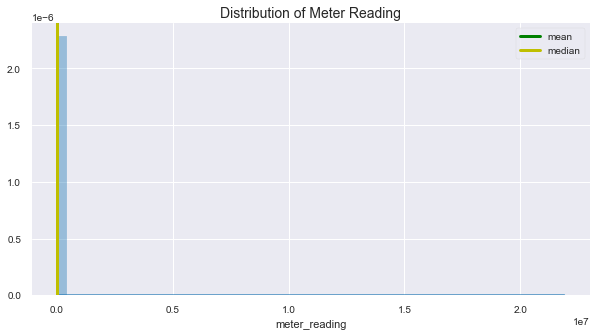

In [223]:
plt.figure(figsize=(10,5))

#set the histogram, mean and median
sns.distplot(train['meter_reading'], kde=True)
plt.axvline(x=train.meter_reading.mean(), linewidth=3, color='g',label='mean')
plt.axvline(x=train.meter_reading.median(), linewidth=3, color='y', label='median')

plt.title('Distribution of Meter Reading', size=14)
plt.legend()

As we can see from the distribution that the values are highly skewed.

The range of values in meter_reading are from 0 10 20 million. the figure above shows that the values are highly concentrated around 0 and hence it is not possible to visualize.

Due to this wide range and highly skewed data the natural log(1 + meter_reading) will be visualized using np.log1p. Since the natural logarithm of zero is minus infinity (a real number to the power of some real number is never 0), np.log1p enables to transform 0 measurements to 1, including those in the visualization.

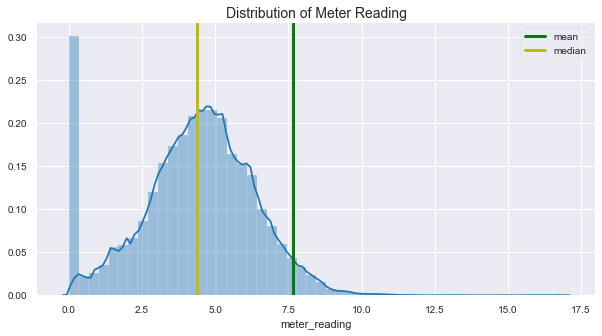

In [224]:
# log transformed plot
plt.figure(figsize=(10,5))

#set the histogram, mean and median
sns.distplot(np.log1p(train['meter_reading']), kde=True)   #np.log1p  is the log transformation(log(x+1))
plt.axvline(x=np.log1p(train.meter_reading.mean()), linewidth=3, color='g',label='mean')
plt.axvline(x=np.log1p(train.meter_reading.median()), linewidth=3, color='y', label='median')

plt.title('Distribution of Meter Reading', size=14)
plt.legend()

* Generally if the distribution of data is skewed to the left, the mean is less than the median, which is often less than the mode. 
* If the distribution of data is skewed to the right, the mode is often less than the median, which is less than the mean
* from the graph above we can see that mean > median that means the distribution is right skewed.This skewness is caused by the significanlty high number of 0 and 1 measurements in the meter_reading. Let's look at the definition if we can get some logical explanation to 0 measurements:

  ## They are the Energy consumption in kWh (or equivalent). This is the real data with   measurement error, which we expect will impose a baseline level of modeling error.
  
meaning : this is the real data with some errors or missing values in the ```meter_reading```.Thus high number of 0 meter reading values shows not only zero consumption but may indicate some missing data in the meter_reading. Moving on with this suspicion, let's see how the distribution will look like if we exclude 0 measurements from the dataset.

I think it is impossible for a building to consume 0 kWh energy at a given time. Every office, home at least having some fridges and other home appliances running all the time.

Thus, I I will visualize meter reading excluding 0 measurements. 




### 2.1.2 Consolidated distribution of positive meter reading values

C:\Users\nehat4\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



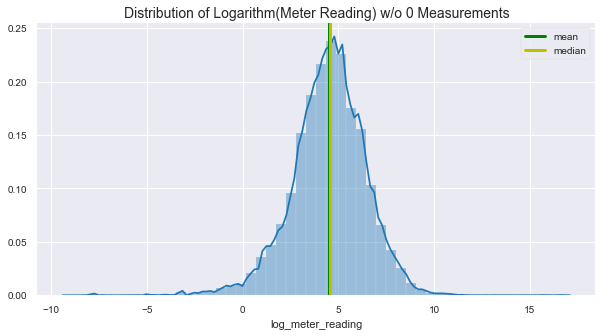

In [225]:
positive_train = train[train['meter_reading']!=0]
positive_train['log_meter_reading'] = np.log(positive_train['meter_reading'])
# plotting the meter_reading with positive values.
plt.figure(figsize=(10,5))

#set the histogram, mean and median
sns.distplot(positive_train['log_meter_reading'], kde=True )  #np.log1p  is the log transformation(log(x+1))
plt.axvline(x=positive_train.log_meter_reading.mean(), linewidth=3, color='g',label='mean')
plt.axvline(x=positive_train.log_meter_reading.median(), linewidth=3, color='y', label='median')

plt.title('Distribution of Logarithm(Meter Reading) w/o 0 Measurements', size=14)
plt.legend()

Now, I have more concrete evidence that 0 observations represents missing values.

Moreover, this is the picture I expected to see in the first place. However, after dropping the zero values and taking the logarithm of the meter reading values, distribution shows a perfect normal distribution. Data is centered around the mean. Mean and median values are equal to each other. Taking the logarithm helped to lower the variance.

Moreover, some immediately observed outliers for log_meter_reading are around -7 and -5 and greater than 10. Let's have a closer look at the outliers:

In [226]:
def outlier_function(df, col_name):
    first_quartile = np.percentile(df[col_name], 25)
    third_quartile = np.percentile(df[col_name], 75)
    IQR = third_quartile - first_quartile
    
    upper_limit = third_quartile + (3*IQR)
    lower_limit = first_quartile - (3*IQR)
    outlier_count = 0
    
    for value in df[col_name].tolist():
        if (value<lower_limit) | (value > upper_limit):
            outlier_count +=1
    return lower_limit , upper_limit , outlier_count

In [227]:
#percentage of outlier in meter_reading

print('{} percent of {} are outliers ' 
      .format(
          100 * (outlier_function(positive_train,'meter_reading')[2]/len(positive_train['meter_reading']))
              ,'meter_reading'))



7.667607088470234 percent of meter_reading are outliers 


In [228]:
positive_train['meter_reading'].sort_values().head()

timestamp
2016-02-22 19:00:00   0.00010
2016-05-31 01:00:00   0.00010
2016-02-23 07:00:00   0.00010
2016-02-23 02:00:00   0.00010
2016-09-25 22:00:00   0.00010
Name: meter_reading, dtype: float64

although i excluded 0s from train dataset, but there are still plenty of values which are very close to 0.

Out of 20 million observations 8% are detected with the logic of determining extreme outliers. We are going to decide what to do with the outliers in the target data at the end of the notebook.

### 2.1.3. Distribution of meter reading among different meter categories

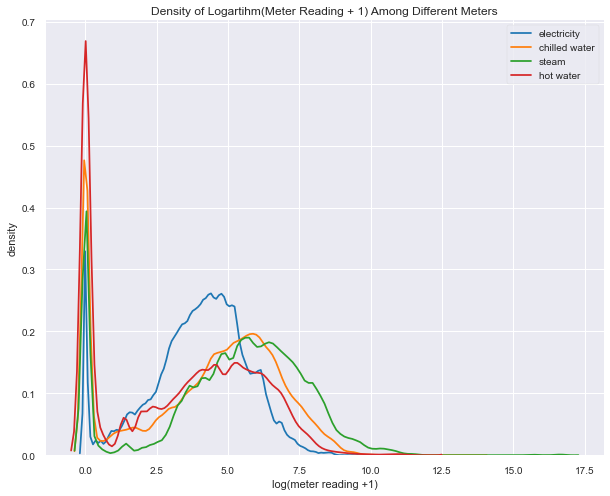

In [229]:
# distribution of the meter reading in meters with zeros

plt.figure(figsize=(10,8))

meters = np.unique(train['meter'])

for meter in meters:
    subset = train.loc[train['meter']==meter,'meter_reading']
    sns.kdeplot(np.log1p(subset),label =meter)
plt.ylabel('density')
plt.xlabel('log(meter reading +1)')
plt.title('Density of Logartihm(Meter Reading + 1) Among Different Meters', fontsize=12)
plt.legend(['electricity', 'chilled water', 'steam', 'hot water'])

observations:
    
1. for the visualisation purpose we took log(x+1) of the meter reading.
2. the readings of chilled water, steam and electricity are less skewed towards zero.meaning we have less missing values and 0 observations in the electricity usage.

This picture shows that meter reading values shows different distribution in each meter category, especially electricity consumption is different than others. Thus, meter is a signifcant variable to determine the meter_reading values. It is already included in the train and test dataset as a determinant factor.

Let's visualize the meter reading values excluding 0 measurements for different meter categories using the dataset created earlier.

### 2.1.4. Distribution of positive_train meter reading among different meter categories

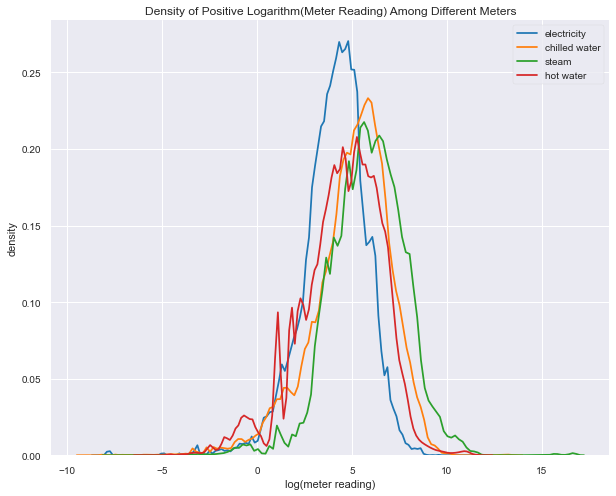

In [230]:
# distribution of the meter reading in meters with zeros

plt.figure(figsize=(10,8))

meters = np.unique(positive_train['meter'])

for meter in meters:
    subset = positive_train.loc[positive_train['meter']==meter,'meter_reading']
    sns.kdeplot(np.log(subset),label =meter)
plt.ylabel('density')
plt.xlabel('log(meter reading)')
plt.title('Density of Positive Logarithm(Meter Reading) Among Different Meters', fontsize=12)
plt.legend(['electricity', 'chilled water', 'steam', 'hot water'])

***Observation after removing zero meter reading values:***
    
Electricity shows a slightly different distribution than other categories. 

Chilled water and steam meter_reading shows similar distributions with close mean values.

Hot water has the least number of datapoints and has more spikes than the other categories.

### 2.1.5 Average daily meter reading values over 2016 

In [241]:
# downsample hourly observations to daily and aggregate meter by category
train_daily_avg_by_meter = (train. groupby('meter').meter_reading
                            .resample('d')
                            .mean()
                            .reset_index())


tidy_train_daily_avg = (train_daily_avg_by_meter
                            .pivot(index='timestamp', columns='meter', values='meter_reading')
                            .reset_index())

tidy_train_daily_avg



meter,timestamp,0,1,2,3
0,2016-01-01,126.71614,129.53300,9147.19261,472.83094
1,2016-01-02,128.75480,132.00145,4878.75387,586.59160
2,2016-01-03,127.36681,138.47548,4756.75450,535.99415
3,2016-01-04,150.32443,139.16803,6480.00767,783.45532
4,2016-01-05,153.21031,134.75895,10448.08865,719.38034
...,...,...,...,...,...
361,2016-12-27,158.97789,266.39132,2242.02552,676.40160
362,2016-12-28,163.95606,263.50917,2110.19733,521.64723
363,2016-12-29,165.92448,223.43044,2177.41520,546.54955
364,2016-12-30,164.60701,166.75811,2363.66233,599.15018


In [242]:
tidy_train_daily_avg.rename(columns = {0: "electricity",
                                       1: "chilled_water",
                                       2: "steam",
                                       3: "hot_water"},
                           inplace=True)



In [449]:
# create meter and color dictionary
meter_dict = {'electricity': 'darkblue',
              'chilled_water':'orange',
              'steam': 'green',
              'hot_water': 'red'
             }

# create figure object and plot each meter category
fig = go.Figure()

for key in meter_dict:
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x= tidy_train_daily_avg.timestamp,
        y= tidy_train_daily_avg[key],
        mode ='lines',
        name=key,
        line_color=meter_dict[key]))
    # add title and show figure
    fig.update_layout(
            title_text = 'Average Daily Energy Consumption of {} in kWh'.format(key),
            xaxis_rangeslider_visible = True)
    fig.show()

Electricity observations spread between 0 and 220 kWh. For the first half of the year consumption does not exceed 160 kWh, for the second half consumption increases and ranges between 160 and 220 kWh. In general electricity consumption shows an increasing trend in 2016.


Chilled water meter has increasing trend from month May - october. Starting from November it shows downward trend.

Steam consumption highest and most volatile consumption range : 0- 80MWph.There is no obvious trend in the steam consumption and steam is utilized only in the first half of the year. For the rest of the year, consumption decreases drastically which may indicate either steam is not used for the rest of the year or the errors (0 measurements) are coming from the steam category in the second half of 2016. There is an interesting spike in the Nov 9, 2016.

Hot water consumption is higher in the winter season i.e. in  month november , december, january and after february it shows decreasing trend.


 [Summer: June - August 
 
Fall: September - November

Winter: December - February

Spring: March - May 

During summer, northern states enjoy warm — even hot — days and cooler mornings and nights, while southern states and tropical areas experience very hot temperatures.

In the fall, temperatures begin to cool down around the country. This is a welcome season in northern regions, where leaves change to beautiful shades of red, yellow and orange.

Winter is fairly mild in the southern states, while the northern, northeastern, midwestern, western mountains and Great Plains regions often encounter snow and colder temperatures.

During the spring, temperatures begin to warm up and thunderstorms and rainstorms are common across the country into the summer months] 

## 2.2. Meter reading VS weather_train data

I am going to visualize weather data available and meter_reading values per meter category to see how each observation of cloud, temperature, pressure, precipitation and wind affects meter reading. Moreover, I am going to look for reasonable explanations of extremes in the chilled water, steam and hot water consumption in the weather data.

To aggreagte hourly observations, weather train data will be downsampled to daily averages. After that, two datasets will be merged on timestamp column since this is the shared column between two.

***weather_data dataframe***

In [271]:
# downsample weather_train dataframe to get daily means
weather_data_daily_average = (weather_data
                              .resample('d')
                              .mean())


weather_data_daily_average.reset_index(inplace=True)

***Merge weather_data and train dataframes***

In [272]:
weather_vs_meter_reading = (train_daily_avg_by_meter
                             .merge(weather_data_daily_average, 
                                    on='timestamp',
                                    how ='left'))

In [274]:
#rename meter column
weather_vs_meter_reading['meter'] = (weather_vs_meter_reading['meter']
                                         .map({0:'electricity',
                                               1: 'chilled_water',
                                               2: 'steam',
                                               3: 'hot_water'})) 

In [275]:
weather_vs_meter_reading.head()

,meter,timestamp,meter_reading,site_id,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
0,electricity,2016-01-01,126.71614,7.28804,5.36549,2.18452,0.46739,0.06303,1019.29634,173.49162,3.68859
1,electricity,2016-01-02,128.75480,7.34043,5.34016,1.98857,-0.32287,-0.03333,1016.61856,201.21547,4.01543
2,electricity,2016-01-03,127.36681,7.33155,5.48235,1.96951,0.24011,0.52778,1012.13946,205.53719,3.92781
3,electricity,2016-01-04,150.32443,7.16471,4.12529,1.97143,-1.98147,0.28099,1011.76242,226.73780,3.70824
4,electricity,2016-01-05,153.21031,7.10909,3.76667,1.85955,-1.51970,0.52917,1016.50979,184.71698,4.13303


### 2.2.2 Average daily weather variable values over 2016 

Spikes and anomalies detected in the section 2.1.3.Average daily meter reading values over 2016 will be investigated while plotting average daily values of weather variables

In [2]:
weather_dict = {'air_temperature': 'red',
                'cloud_coverage': 'orange',
                'dew_temperature' : 'coral',
                'precip_depth_1_hr' : ' teal',
                 'sea_level_pressure': 'purple',
                 'wind_direction': "purple",
                "wind_speed": "navy"
               }

In [3]:
# create plotly object and plot weather variables against dates


for key in weather_dict:
    fig = go.Figure()
    fig.add_trace(go
                    .Scatter(x = weather_vs_meter_reading['timestamp'],
                             y = weather_vs_meter_reading[key],
                             name = key,
                             line_color = weather_dict[key]))
    fig.update_layout(title_text='Time series of {} variable'.format(key))
    fig.show()

NameError: name 'go' is not defined

Recall Dec 19, 2016 where there is a peak int the hot_water consumption. On that date, 4th lowest air_temperature is recorded 1 degrees celcius, this might explain the spike in the hot_water consumption. Obviously, air temperature trend shows that this measurements recorded somewhere in Northern hemisphere.

Recall from the definition dew temperature it is usually lower than air_temperature. If you look at air_temperature and dew_temperatur together, it proves this statement. Especially, dew_temperature is 5 degrees lower than the air_temperature and shares the same trend as air_temperature.

Average daily cloud coverage values are between 1 and 5. Higher cloud coverage indicates cloudy days, thus in winter there are more cloudy days.

If we look at the precipt_depth_1_hr half of the year is rainy, and half of the year seems to be dry. There are some days where average daily precip_depth_1_hr goes beyond 5.

Atmospheric pressure is an indicator of weather. When a low-pressure system moves into an area, it usually leads to cloudiness, wind, and precipitation. High-pressure systems usually lead to fair, calm weather. hence in months june - septmeber low sea level pressure are recorded. this pressuere shows increasing trend in the winter season (november , december).

Wind_direction will make more sense if we look at it as directions (north, south and so on). Thus I will convert them to directions. Average wind speed is around 3.5 and varies values throughout the year. Avergae wind sped are highest in month of march and feb .



### 2.2.3. Pairplot of meter reading vs weather data 

Pairplots are very useful to look at several continuous variables relationships in one chart. Ploly version of pairplots are scatterplots or scatter matrix.

To understand the relationship between meter_reading and weather related variables, scatter matrix of energy consumption data and weather data will be visualized and relationships & correlations will be searched.

In [451]:
fig = px.scatter_matrix(weather_vs_meter_reading,
                       dimensions=["meter_reading",
                                    "air_temperature",
                                    "cloud_coverage",
                                    "dew_temperature",
                                    "precip_depth_1_hr",
                                    "sea_level_pressure",
                                    "wind_direction",
                                    "wind_speed"],
                        color='meter')

fig.update_layout(title='Weather Varaibles and Meter Reading',
                   dragmode='select',
                   width=1400,
                   height=1400,
                   )
fig.update_traces(diagonal_visible=True)

fig.show()

***Electricity:***
* as air and dew temperature goes up, electricity consumption increases.
* Cloud coverage, sea level pressure, precip depth 1 hour shows positive trend with the electricity consumption. Although their correlations are not as strong as temperature variables.

***Chilled water***
* As the air and dew temperature rises, chilled water consumption increases.
* Other weather variables shows a slightly weaker positive trend with chilled water consumption, compared to temperature variables.

***Steam***
* Although the data range is wider and higher than the weather variables, air temperature, dew temperature and cloud coverage shows positive trend with the steam consumption.

***Hot-water***
* Other weather variables shows positive trend with the hot water consumption.
* Air and dew temprature shows negative trend with the hot water consumption.

One other important observation is air and dew temperature are highly collinear. All of the weather variables whether it is slight or strong have an affect on energy consumption.

## 2.3.Meter reading VS building data categorical features

### 2.3.1.Prepare and Merge DataFrames

In [358]:
# group traindataset by building and meter category

train_by_building = (train
                       .groupby(['building_id','meter'])
                       .meter_reading.mean()
                       .reset_index())
train_by_building.head()

,building_id,meter,meter_reading
0,0,0,146.45498
1,1,0,74.86539
2,2,0,14.55138
3,3,0,235.54997
4,4,0,976.55675


In [359]:
# merge grouped train dataframe with building dataframe
building_w_meter_reading =  pd.merge(train_by_building, building, on='building_id', how='left')
building_w_meter_reading

,building_id,meter,meter_reading,site_id,primary_use,square_feet,year_built,floor_count
0,0,0,146.45498,0,Education,7432,2008.00000,nan
1,1,0,74.86539,0,Education,2720,2004.00000,nan
2,2,0,14.55138,0,Education,5376,1991.00000,nan
3,3,0,235.54997,0,Education,23685,2002.00000,nan
4,4,0,976.55675,0,Education,116607,1975.00000,nan
...,...,...,...,...,...,...,...,...
2375,1444,0,7.48213,15,Entertainment/public assembly,19619,1914.00000,nan
2376,1445,0,4.73282,15,Education,4298,nan,nan
2377,1446,0,3.59216,15,Entertainment/public assembly,11265,1997.00000,nan
2378,1447,0,187.11799,15,Lodging/residential,29775,2001.00000,nan


### 2.3.2. Meter reading distribution among primary uses 

Recall from the profiling report 80% of the primary_use values consists of the top 5 values.
* Education	549
* Office	279
* Entertainment/public assembly	184
* Public services	156
* Lodging/residentia 147

I am going to decode top 5 primary_use values as a new column first, then look for the distribution of meter reading among different primary use.


In [360]:
# add log-meter reading to visualise meter_reading distribution.
building_w_meter_reading['log_meter_reading'] = np.log1p(building_w_meter_reading['meter_reading'])

In [361]:
# map primary use column
building_w_meter_reading['primary_use_mapped'] = (building_w_meter_reading['primary_use']
                                                    .map({'Office':'Office',
                                                          'Education': 'Education',
                                                          'Entertainment/public assembly':'Entertainment/public',
                                                          'Lodging/residential': 'Residential',
                                                          'Public services': 'Public services'
                                                         }))

In [362]:
# replace the rest with Others
building_w_meter_reading['primary_use_mapped'] .replace(to_replace=np.nan,
                                                        value='Other',
                                                        inplace=True)

In [363]:
building_w_meter_reading['meter'] = (building_w_meter_reading['meter']
                                         .map({0: 'electricity',
                                               1: 'chilled_water',
                                               2: 'steam',
                                               3: 'hot_water'}))

In [364]:
# split bıilding_w_meter_reading dataset per primary use category

education = (building_w_meter_reading[building_w_meter_reading['primary_use_mapped'] == 'Education'])

office = (building_w_meter_reading[building_w_meter_reading['primary_use_mapped'] == 'Office'])

entertainment_public = (building_w_meter_reading[building_w_meter_reading['primary_use_mapped'] == 'Entertainment/public'])

residential = (building_w_meter_reading[building_w_meter_reading['primary_use_mapped'] == 'Residential'])

public_services = (building_w_meter_reading[building_w_meter_reading['primary_use_mapped'] == 'Public services'])

other = (building_w_meter_reading[building_w_meter_reading['primary_use_mapped'] == 'Other'])

In [379]:
# create distplot parameters as lists

hist_data = [education['log_meter_reading'],
             office['log_meter_reading'],
             entertainment_public['log_meter_reading'],
             residential['log_meter_reading'],
             public_services['log_meter_reading'],
             other['log_meter_reading']]

group_labels = ['education', 'office', 'entertainment_public',
               'residential', 'public_services', 'other']

cm = sns.color_palette()
colors = cm[:6]
# colors = ['#333F44', '#37AA9C', '#94F3E4', '#66CCFF', '#2C89AB', '#0324A9']


In [445]:
# create KDE plot of log-meter_readings
# fig = ff.create_distplot(hist_data, group_labels, show_hist=False, show_rug=True,colors=colors)
# fig.update_layout(title_text='Distribution of logarithm meter reading a,ong primary use')
# fig.show()

fig = ff.create_distplot(hist_data, group_labels, 
                         show_hist=False, colors=colors, show_rug=True)
fig.update_layout(title_text='Distribution of Logarithm Meter Reading among Primary Use')
fig.show()


All primary_use categories shows uni-modal distirbution. We have fewer data points where log_meter_reading values are greater than 10 in all primary use categories.

Median values log_meter_reading in Education, residential and office are between 4.5 and 4.9, whereas median values of entertainment, publice services and other are between 3.9 and 4.3.

***Education***:

This primary use category has the most datapoints (38%) in the primary_use column.
Meter reading values are normally distributed between 0 and 10.
There is one outlier in this category whose log_meter_reading value is greater than 15.

***Residential***:

Residential category is the 10% of all primary_use values.
Meter reading values are spread between 1.5 and 8.
This primary use category has the narrowest data range.

***Office***:

Office category has the second most datapoints (20%).
Log meter reading values spread between 0.7 and 8.5.
There are several outliers greater than 10.

***Entertainment/public***:

Entertainment/public category is the 13% of all primary_use values.
Meter reading value spread between 0.1 and 9.6.
Entertainment/public category has one outlier point greater than 10.

***Public services***:

This category distributed between 0.7 and 7.5 having 3 outlier points.

***Other***:

Log meter reading values are spread between 0.2 and 8.2.
It has one outlier greater than 10.

Although some of primary_use meter reading distirbution resembles, it has importance in determining a meter_reading values, by each primary_use category having different ranges of log_meter_reading_values.



### 2.3.3. Meter reading distribution among site id as violinplot

To understand how meter reading values distributed in each site_id lets first understand the distribution of site_ids in the building dataset.

In [452]:
fig = px.histogram(building, x='site_id')
fig.update_layout(title_text='Distribution of site ids')
fig.show()

Most of the training set examples are coming from site id 0, 2, 3, 4, 5, 9, 13, 14 and 15.

lets see the violin plot for each category of site_id.


In [432]:
# create site id list
site_ids =building_w_meter_reading.site_id.unique().tolist()

#create plotly object and visualise the distribution
fig = go.Figure()

#add a violin plot for each site id
for site_id in site_ids:
    fig.add_trace(go.Violin(y=building_w_meter_reading[building_w_meter_reading['site_id']==site_id]
                           ['log_meter_reading'],
                            name = site_id,
                            box_visible=True
                        ) )
fig.update_layout(title_text='Distribution of Logarithm Meter Reading among Site ID')
fig.show()

* Site ids 0, 1, 2, 3, 4, 5, 8, 9, 14 and 15 have similar meter reading distributions.
* Site ids 6 and 10 meter_reading values shares almost the same distribution and summary statistics.
* Site id 13 has the widest meter reading value range that goes beyond log_meter_reading_value 10.
* Site id 11 has the narrowest meter reading values range, centered around 5.
* Site id 13 shows the widest meter_reading distributions.

As site_id's are highly correlated with building id's, I might one to keep only one of them which I will decide at the end of this notebook

## 2.4.Meter reading VS building data continuous features as scatterplots

Logarithm of the meter reading values in each meter category will be visualized against the continuous variables (square_feet, year and floor_count) of the building dataset.

### 2.4.1. Scatter plot of meter reading VS square feet

In [431]:
fig = px.scatter(building_w_meter_reading,x='square_feet', y='log_meter_reading',
                    color='meter', hover_data=['meter_reading'])
fig.update_layout(title_text='Meter reading Vs square feet among different Meters')
fig.show()

There is a clear connectcion between square feet and meter_reading values in all categories, whcih can be captured by intuition also: As the size of the building increases, it consumes more in each category.

### 2.4.2 Scatter plot of meter_reading Vs Age of the building

I will add one more column as age using year_built column and use that one.

In [438]:
currentYear = datetime.now().year
building_w_meter_reading['age'] = currentYear - building_w_meter_reading['year_built']

In [440]:
fig = px.scatter(building_w_meter_reading, x='age', y='log_meter_reading',
                 color='meter', hover_data=['meter_reading'])
fig.update_layout(title_text='Meter Reading VS Age of the Building Among Different Meters')
fig.show()


* There is no obivous relationship between the age and log_meter_reading values of electricity and steam.

* There is obvious relationship in the hot_water category as the age of the building increases hot water consumption increases.

* Other obvious relationship is as the building age increases chilled water consumption decrease. Maybe old buildings don't have chilled water supply structures

### 2.4.3 Scatter Plot of meter_reading Vs Floor count

In [447]:
fig = px.scatter(building_w_meter_reading , x='floor_count', y='log_meter_reading',
                color='meter', hover_data=['meter_reading'])
fig.update_layout(title_text='Meter Reading VS Floor count of the Building Among Different Meters')
fig.show()

Due to the less data points we have in the floor_count, it is hard to extract some meaningful conclusions from the graph, although it gives pretends to give for electricity, chilled water and hot water.

# Findings from EDA

After a long and very detailed exploratory data analysis, here are the most important findings:

Meter reading values are higly and positively skewed. When we apply log1p function (calculates log(x+1)) to meter reading values we are able to obtain meaningful visualizations and conclusions.

There are significant number of 0 observations in the meter reading, which is due to erroneous or missing measurements. For generating the predictions on meter reading this is a valuable information.

Even with the extreme outlier detection 7% of the meter reading observations are detected as outliers. I will keep all of the rows of the train data and build machine learning model with them, even 800.000 square feet buildings.

Energy consumption has different data ranges among meter categories and shows different distributions. Chilled water and hot_water time-series consumption shows seasonality: Hot water consumption increases in winter and chilled water consumption increases in summer. Electricty consumption has an increasing trend towards the end of 2016. There are no obvious patterns or seasonality effect in the steam consumption.

Primary use, site id, year built (or age), square feet has a significant effect in determining meter reading values which also intuitively makes sense. Floor_count has high missing values, so it will manipulate the training data into a different direction if we impute it. So, I am going to exclude that one from the training set in the second notebook.

Some weather variables (air_temperature, dew_temperature, cloud_coverage) have high impact on meter reading values, some of them have slight (wind_direction, wind_speed) effect. For that reason, I am going to convert wind_direction to categorical data in the feature engineering part. Air and dew temperature are highly collinear. All of the weather variables might be useful for feaure engineering and addition, so I will keep all of them.